# Анализ финансовых рядов.
Самой популярной криптовалютой является Bitcoin, стоимость которого уже превысила $15k. Однако, в мире существуют еще несколько тысяч альтернативных криптовалют, большая часть из которых ничего особенного из себя не представляют и даже динамика их цен совпадает с флагманским биткоином. 
- Задача найти криптовалюты, которые не будут попадать в кластер биткоина на разных временных промежутках

Установка библиотеки cryptocompare

In [1]:
import pandas as pd
import numpy as np
import time
from tqdm.autonotebook import tqdm
import random

import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno

from tslearn.clustering import TimeSeriesKMeans, silhouette_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler

import cryptocompare

/var/folders/84/q1qfkkn11dn0bkqq_3fg56040000gn/T/ipykernel_74504/1836415664.py:4: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm
/Users/alsukurmakaeva/miniconda3/envs/dqual_alpha_nlp/lib/python3.10/site-packages/tslearn/bases/bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


In [2]:
name_tikers_all = cryptocompare.get_coin_list(format=True)

In [3]:
name_tikers_all

['BTCD',
 'CRAIG',
 'XBS',
 'XPY',
 'PRC',
 'YBC',
 'DANK',
 'GIVE',
 'KOBO',
 'DT',
 'CETI',
 'SUP',
 'XPD',
 'GEO',
 'CHASH',
 'NXTI',
 'WOLF',
 'XDP',
 '2015',
 '42',
 'AC',
 'ACOIN',
 'AERO',
 'ALF',
 'AEGIS',
 'AMERICANCOIN',
 'ALIEN',
 'ARCH',
 'AURORAC',
 'AXR',
 'BETACOIN',
 'BEAN',
 'BLU',
 'BOST',
 'BQC',
 'MOONC',
 'ZET',
 'SXC',
 'QTL',
 'ENRG',
 'QRK',
 'RIC',
 'DGC',
 'LIMX',
 'BTB',
 'CAIX',
 'BTMK',
 'BUK',
 'CACH',
 'CANN',
 'CAP',
 'CASH',
 'CATC',
 'CCN',
 'CINNI',
 'CXC',
 'CLAM',
 'CLR',
 'CMC',
 'CNC',
 'CNL',
 'COMM',
 'COOL',
 'CRACK',
 'CRYPT',
 'CSC',
 'DEM',
 'DIAM',
 'DRKC',
 'DSB',
 'DEVCOIN',
 'EFL',
 'ELC',
 'EMD',
 'EXCL',
 'EXE',
 'EZC',
 'FLAP',
 'FC2',
 'FFC',
 'FIBRE',
 'FRC',
 'FLT',
 'FRK',
 'FRAC',
 'FSTC',
 'GLOBAL',
 'GLX',
 'GLYPH',
 'GML',
 'GUE',
 'HAL',
 'HBN',
 'HUC',
 'HVC',
 'HYP',
 'ICB',
 'IFC',
 'IXC',
 'JBS',
 'JKC',
 'JUDGE',
 'KDC',
 'KEYC',
 'LK7',
 'LKY',
 'LSD',
 'LTB',
 'LTCD',
 'LTCX',
 'LXC',
 'LYC',
 'MAX',
 'MEC',
 'MEDIT',


Посмотрим, какое количество торгующих тикеров есть 

In [4]:
len(name_tikers_all)

8426

Выберем 100 рандомных тикеров и убедимся в том, что BTC есть в этом списке. В случае, если нет, добавим самостоятельно.

In [5]:
name_tikers = random.sample(name_tikers_all, 100)

In [6]:
'BTC' in name_tikers

False

In [7]:
name_tikers.append('BTC')

Скачаем цены закрытия для имеющихся криптовалют по трем разным временным промежуткам:
- За последний час с минутной частотой

In [22]:
data = pd.DataFrame()

In [23]:
first_l = [np.nan for i in range(60)]

for tiker in name_tikers:
    data[tiker] = first_l

/var/folders/84/q1qfkkn11dn0bkqq_3fg56040000gn/T/ipykernel_74504/3540488009.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data[tiker] = first_l


In [24]:
bad_tikers = []
for tiker in tqdm(name_tikers):
    crypto_data = cryptocompare.get_historical_price_minute(tiker, currency='USD', limit=60)
    try:
        for i in range(3*24):
            time.sleep(0.100)
            data[tiker][i] = crypto_data[i]['close']
    except Exception:
        bad_tikers.append(tiker) 
        continue

  1%|▍                                          | 1/101 [00:00<01:05,  1.52it/s]

[ERROR] CCCAGG market does not exist for this coin pair (SIMPLE-USD)


  2%|▊                                          | 2/101 [00:01<00:47,  2.07it/s]

[ERROR] CCCAGG market does not exist for this coin pair (AURY-USD)


  3%|█▎                                         | 3/101 [00:01<00:40,  2.45it/s]

[ERROR] CCCAGG market does not exist for this coin pair (TBE-USD)


  4%|█▋                                         | 4/101 [00:01<00:37,  2.60it/s]

[ERROR] CCCAGG market does not exist for this coin pair (KPAD-USD)


  8%|███▍                                       | 8/101 [00:22<05:29,  3.54s/it]

[ERROR] CCCAGG market does not exist for this coin pair (AUSCM-USD)


 10%|████▏                                     | 10/101 [00:29<04:59,  3.29s/it]

[ERROR] CCCAGG market does not exist for this coin pair (BIO-USD)


 12%|████▉                                     | 12/101 [00:37<04:45,  3.21s/it]

[ERROR] CCCAGG market does not exist for this coin pair (FFA-USD)


 13%|█████▍                                    | 13/101 [00:37<03:29,  2.38s/it]

[ERROR] CCCAGG market does not exist for this coin pair (STN-USD)


 14%|█████▊                                    | 14/101 [00:38<02:34,  1.77s/it]

[ERROR] CCCAGG market does not exist for this coin pair (PUSH-USD)


 16%|██████▋                                   | 16/101 [00:45<03:26,  2.43s/it]

[ERROR] CCCAGG market does not exist for this coin pair (ICOB-USD)


 17%|███████                                   | 17/101 [00:45<02:36,  1.87s/it]

[ERROR] CCCAGG market does not exist for this coin pair (CLY-USD)


 18%|███████▍                                  | 18/101 [00:46<02:01,  1.47s/it]

[ERROR] CCCAGG market does not exist for this coin pair (EL-USD)


 20%|████████▎                                 | 20/101 [00:53<03:03,  2.27s/it]

[ERROR] CCCAGG market does not exist for this coin pair (TTM-USD)


 27%|███████████▏                              | 27/101 [01:34<05:33,  4.50s/it]

[ERROR] CCCAGG market does not exist for this coin pair (PIZZA-USD)


 28%|███████████▋                              | 28/101 [01:35<03:58,  3.26s/it]

[ERROR] CCCAGG market does not exist for this coin pair (PASC-USD)


 29%|████████████                              | 29/101 [01:35<02:51,  2.39s/it]

[ERROR] CCCAGG market does not exist for this coin pair (NKCLC-USD)


 30%|████████████▍                             | 30/101 [01:36<02:06,  1.78s/it]

[ERROR] CCCAGG market does not exist for this coin pair (KAIKEN-USD)


 31%|████████████▉                             | 31/101 [01:36<01:35,  1.36s/it]

[ERROR] CCCAGG market does not exist for this coin pair (OLAND-USD)


 34%|██████████████▏                           | 34/101 [01:50<03:32,  3.17s/it]

[ERROR] CCCAGG market does not exist for this coin pair (IJZ-USD)


 35%|██████████████▌                           | 35/101 [01:51<02:40,  2.43s/it]

[ERROR] CCCAGG market does not exist for this coin pair (CATZ-USD)


 36%|██████████████▉                           | 36/101 [01:52<02:03,  1.90s/it]

[ERROR] CCCAGG market does not exist for this coin pair (CARTAXI-USD)


 40%|████████████████▋                         | 40/101 [02:13<03:46,  3.71s/it]

[ERROR] CCCAGG market does not exist for this coin pair (XDAI-USD)


 44%|██████████████████▎                       | 44/101 [02:34<03:58,  4.19s/it]

[ERROR] CCCAGG market does not exist for this coin pair (TAUR-USD)


 45%|██████████████████▋                       | 45/101 [02:34<02:52,  3.07s/it]

[ERROR] CCCAGG market does not exist for this coin pair (SPORE-USD)


 47%|███████████████████▌                      | 47/101 [02:42<02:51,  3.18s/it]

[ERROR] CCCAGG market does not exist for this coin pair (LEMC-USD)


 48%|███████████████████▉                      | 48/101 [02:42<02:04,  2.35s/it]

[ERROR] CCCAGG market does not exist for this coin pair (BSGG-USD)


 49%|████████████████████▍                     | 49/101 [02:43<01:30,  1.75s/it]

[ERROR] CCCAGG market does not exist for this coin pair (NEKO-USD)


 50%|████████████████████▊                     | 50/101 [02:43<01:08,  1.35s/it]

[ERROR] CCCAGG market does not exist for this coin pair (TNS-USD)


 51%|█████████████████████▌                    | 52/101 [02:50<01:49,  2.24s/it]

[ERROR] CCCAGG market does not exist for this coin pair (MONARCH-USD)


 52%|██████████████████████                    | 53/101 [02:51<01:23,  1.75s/it]

[ERROR] CCCAGG market does not exist for this coin pair (YFBETA-USD)


 54%|██████████████████████▊                   | 55/101 [02:58<01:50,  2.40s/it]

[ERROR] CCCAGG market does not exist for this coin pair (SHB4-USD)


 55%|███████████████████████▎                  | 56/101 [02:58<01:20,  1.78s/it]

[ERROR] CCCAGG market does not exist for this coin pair (FAKT-USD)


 56%|███████████████████████▋                  | 57/101 [02:59<00:59,  1.36s/it]

[ERROR] CCCAGG market does not exist for this coin pair (QUARASHI-USD)


 58%|████████████████████████▌                 | 59/101 [03:06<01:33,  2.22s/it]

[ERROR] CCCAGG market does not exist for this coin pair (PBLK-USD)


 60%|█████████████████████████▎                | 61/101 [03:13<01:44,  2.62s/it]

[ERROR] CCCAGG market does not exist for this coin pair (BITCRATIC-USD)


 61%|█████████████████████████▊                | 62/101 [03:13<01:15,  1.94s/it]

[ERROR] CCCAGG market does not exist for this coin pair (NS2DRP-USD)


 62%|██████████████████████████▏               | 63/101 [03:14<00:56,  1.47s/it]

[ERROR] CCCAGG market does not exist for this coin pair (WSB-USD)


 63%|██████████████████████████▌               | 64/101 [03:14<00:41,  1.13s/it]

[ERROR] CCCAGG market does not exist for this coin pair (BZENIQ-USD)


 66%|███████████████████████████▊              | 67/101 [03:28<01:39,  2.93s/it]

[ERROR] CCCAGG market does not exist for this coin pair (UTU-USD)


 67%|████████████████████████████▎             | 68/101 [03:29<01:11,  2.17s/it]

[ERROR] CCCAGG market does not exist for this coin pair (ANN-USD)


 68%|████████████████████████████▋             | 69/101 [03:29<00:52,  1.63s/it]

[ERROR] CCCAGG market does not exist for this coin pair (CMSN-USD)


 70%|█████████████████████████████▌            | 71/101 [03:36<01:10,  2.34s/it]

[ERROR] CCCAGG market does not exist for this coin pair (ENCX-USD)


 71%|█████████████████████████████▉            | 72/101 [03:36<00:50,  1.76s/it]

[ERROR] CCCAGG market does not exist for this coin pair (CPAN-USD)


 74%|███████████████████████████████▏          | 75/101 [03:51<01:24,  3.27s/it]

[ERROR] CCCAGG market does not exist for this coin pair (WGL-USD)


 77%|████████████████████████████████▍         | 78/101 [04:05<01:24,  3.68s/it]

[ERROR] CCCAGG market does not exist for this coin pair (REC-USD)


 78%|████████████████████████████████▊         | 79/101 [04:06<00:59,  2.72s/it]

[ERROR] CCCAGG market does not exist for this coin pair (HDX-USD)


 79%|█████████████████████████████████▎        | 80/101 [04:06<00:42,  2.02s/it]

[ERROR] CCCAGG market does not exist for this coin pair (NLX-USD)


 80%|█████████████████████████████████▋        | 81/101 [04:06<00:30,  1.51s/it]

[ERROR] CCCAGG market does not exist for this coin pair (DUN-USD)


 82%|██████████████████████████████████▌       | 83/101 [04:13<00:40,  2.27s/it]

[ERROR] CCCAGG market does not exist for this coin pair (LOV-USD)


 84%|███████████████████████████████████▎      | 85/101 [04:21<00:42,  2.65s/it]

[ERROR] CCCAGG market does not exist for this coin pair (URUS-USD)


 86%|████████████████████████████████████▏     | 87/101 [04:28<00:41,  2.98s/it]

[ERROR] CCCAGG market does not exist for this coin pair (XET-USD)


 88%|█████████████████████████████████████     | 89/101 [04:35<00:36,  3.01s/it]

[ERROR] CCCAGG market does not exist for this coin pair (LARIX-USD)


 94%|███████████████████████████████████████▌  | 95/101 [05:10<00:26,  4.48s/it]

[ERROR] CCCAGG market does not exist for this coin pair (BXH-USD)


 95%|███████████████████████████████████████▉  | 96/101 [05:10<00:16,  3.27s/it]

[ERROR] CCCAGG market does not exist for this coin pair (SWOP-USD)


 97%|████████████████████████████████████████▊ | 98/101 [05:18<00:09,  3.20s/it]

[ERROR] CCCAGG market does not exist for this coin pair (DVRS-USD)


 98%|█████████████████████████████████████████▏| 99/101 [05:18<00:04,  2.35s/it]

[ERROR] CCCAGG market does not exist for this coin pair (BARK-USD)


 99%|████████████████████████████████████████▌| 100/101 [05:19<00:01,  1.75s/it]

[ERROR] CCCAGG market does not exist for this coin pair (CRYPTOPRO-USD)


100%|█████████████████████████████████████████| 101/101 [05:25<00:00,  3.23s/it]


In [25]:
data

,SIMPLE,AURY,TBE,KPAD,MSR,LTHN,BIX,AUSCM,GSTC,BIO,...,NAH,ITAM,LIGHT,BXH,SWOP,NUKE,DVRS,BARK,CRYPTOPRO,BTC
0,NaN,NaN,NaN,NaN,0.004190,0.000233,0.01289,NaN,0.02049,NaN,...,0.000163,0.000466,0.000002,NaN,NaN,0.00238,NaN,NaN,NaN,23279.50
1,NaN,NaN,NaN,NaN,0.004191,0.000233,0.01289,NaN,0.02049,NaN,...,0.000163,0.000466,0.000002,NaN,NaN,0.00238,NaN,NaN,NaN,23285.93
2,NaN,NaN,NaN,NaN,0.004191,0.000233,0.01289,NaN,0.02049,NaN,...,0.000163,0.000466,0.000002,NaN,NaN,0.00238,NaN,NaN,NaN,23281.70
3,NaN,NaN,NaN,NaN,0.004189,0.000233,0.01290,NaN,0.02048,NaN,...,0.000163,0.000465,0.000002,NaN,NaN,0.00238,NaN,NaN,NaN,23274.87
4,NaN,NaN,NaN,NaN,0.004190,0.000233,0.01290,NaN,0.02049,NaN,...,0.000163,0.000466,0.000002,NaN,NaN,0.00238,NaN,NaN,NaN,23280.19
5,NaN,NaN,NaN,NaN,0.004193,0.000233,0.01289,NaN,0.02050,NaN,...,0.000163,0.000466,0.000002,NaN,NaN,0.00238,NaN,NaN,NaN,23295.49
6,NaN,NaN,NaN,NaN,0.004193,0.000233,0.01290,NaN,0.02050,NaN,...,0.000163,0.000466,0.000002,NaN,NaN,0.00238,NaN,NaN,NaN,23297.11
7,NaN,NaN,NaN,NaN,0.004194,0.000233,0.01289,NaN,0.02050,NaN,...,0.000163,0.000466,0.000002,NaN,NaN,0.00238,NaN,NaN,NaN,23298.63
8,NaN,NaN,NaN,NaN,0.004192,0.000233,0.01289,NaN,0.02049,NaN,...,0.000163,0.000466,0.000002,NaN,NaN,0.00238,NaN,NaN,NaN,23286.56
9,NaN,NaN,NaN,NaN,0.004192,0.000233,0.01290,NaN,0.02049,NaN,...,0.000163,0.000466,0.000002,NaN,NaN,0.00238,NaN,NaN,NaN,23289.69


<AxesSubplot: >

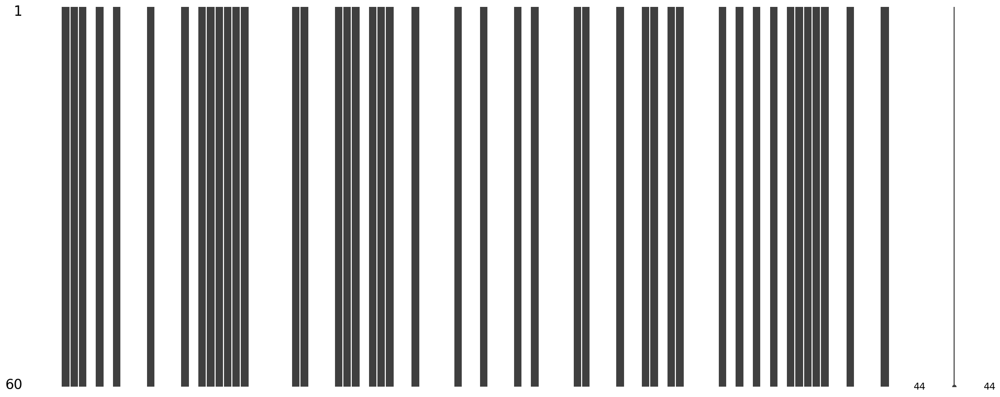

In [26]:
msno.matrix(data)

In [14]:
missing_values = ((data.isna().sum() / len(data)) * 100).sort_values(ascending=False)
missing_values

SIMPLE    100.0
IJZ       100.0
CPAN      100.0
URUS      100.0
LOV       100.0
          ...  
OCN         0.0
HLC         0.0
KOK         0.0
UPUSD       0.0
BTC         0.0
Length: 101, dtype: float64

In [32]:
for col in data.columns:
    if (data[col].isna().sum() / len(data)) * 100 == 100.0:
        data.drop(col, axis=1, inplace=True)

In [33]:
data

,MSR,LTHN,BIX,GSTC,ETSC,TRICK,COV,METIS,CCO,CFX,...,XOR,IX,IVY,PLA,WISH,NAH,ITAM,LIGHT,NUKE,BTC
0,0.004190,0.000233,0.01289,0.02049,0.007,0.00198,0.2016,32.89,0.5030,0.2212,...,3.536,0.0001,0.03958,0.2604,0.005985,0.000163,0.000466,0.000002,0.00238,23279.50
1,0.004191,0.000233,0.01289,0.02049,0.007,0.00198,0.2017,32.89,0.5032,0.2210,...,3.529,0.0001,0.03959,0.2603,0.005987,0.000163,0.000466,0.000002,0.00238,23285.93
2,0.004191,0.000233,0.01289,0.02049,0.007,0.00198,0.2016,32.85,0.5029,0.2207,...,3.537,0.0001,0.03958,0.2603,0.005984,0.000163,0.000466,0.000002,0.00238,23281.70
3,0.004189,0.000233,0.01290,0.02048,0.007,0.00198,0.2016,32.85,0.5028,0.2206,...,3.490,0.0001,0.03957,0.2602,0.005983,0.000163,0.000465,0.000002,0.00238,23274.87
4,0.004190,0.000233,0.01290,0.02049,0.007,0.00198,0.2016,32.85,0.5028,0.2207,...,3.519,0.0001,0.03958,0.2605,0.005983,0.000163,0.000466,0.000002,0.00238,23280.19
5,0.004193,0.000233,0.01289,0.02050,0.007,0.00198,0.2017,32.85,0.5030,0.2213,...,3.524,0.0001,0.03960,0.2605,0.005986,0.000163,0.000466,0.000002,0.00238,23295.49
6,0.004193,0.000233,0.01290,0.02050,0.007,0.00198,0.2018,32.85,0.5030,0.2213,...,3.502,0.0001,0.03961,0.2605,0.005986,0.000163,0.000466,0.000002,0.00238,23297.11
7,0.004194,0.000233,0.01289,0.02050,0.007,0.00198,0.2018,32.85,0.5032,0.2221,...,3.497,0.0001,0.03961,0.2606,0.005987,0.000163,0.000466,0.000002,0.00238,23298.63
8,0.004192,0.000233,0.01289,0.02049,0.007,0.00198,0.2044,32.85,0.5030,0.2225,...,3.495,0.0001,0.03959,0.2606,0.005985,0.000163,0.000466,0.000002,0.00238,23286.56
9,0.004192,0.000233,0.01290,0.02049,0.007,0.00198,0.2023,33.01,0.5030,0.2206,...,3.517,0.0001,0.03959,0.2605,0.005986,0.000163,0.000466,0.000002,0.00238,23289.69


<AxesSubplot: >

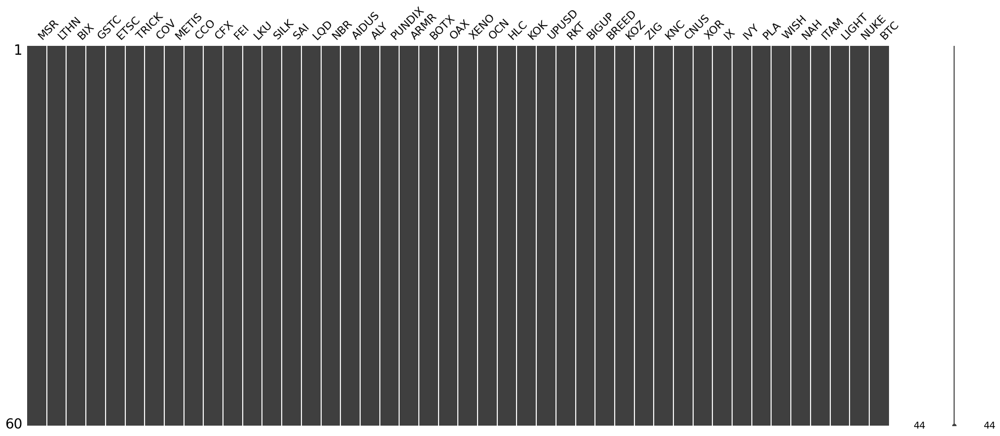

In [34]:
msno.matrix(data)

In [35]:
data.shape

(60, 44)

/var/folders/84/q1qfkkn11dn0bkqq_3fg56040000gn/T/ipykernel_74504/1234264003.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20,5))


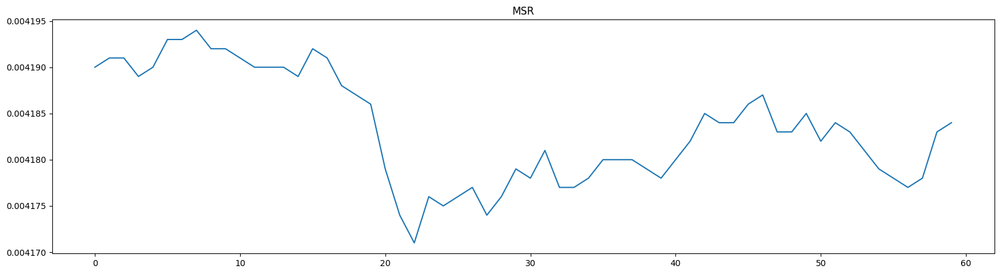

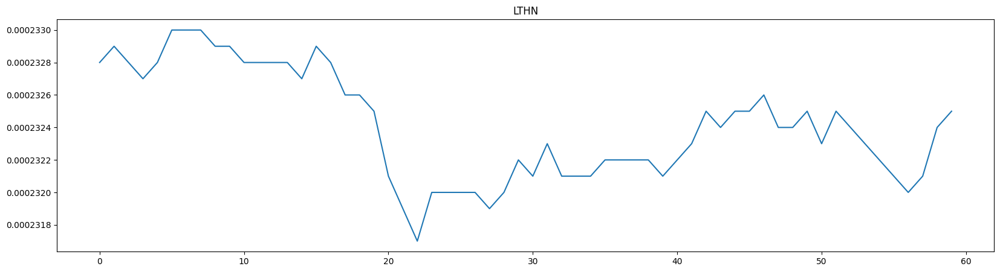

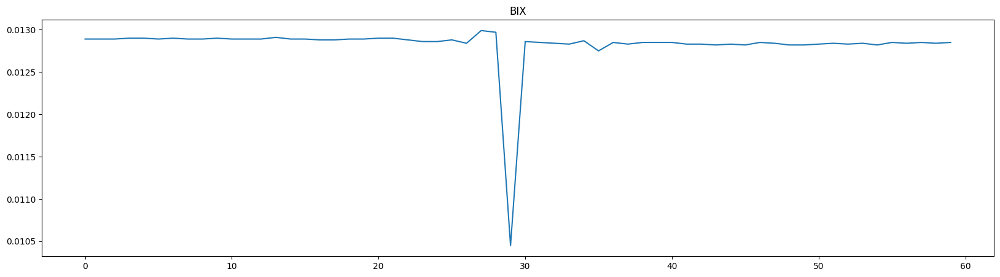

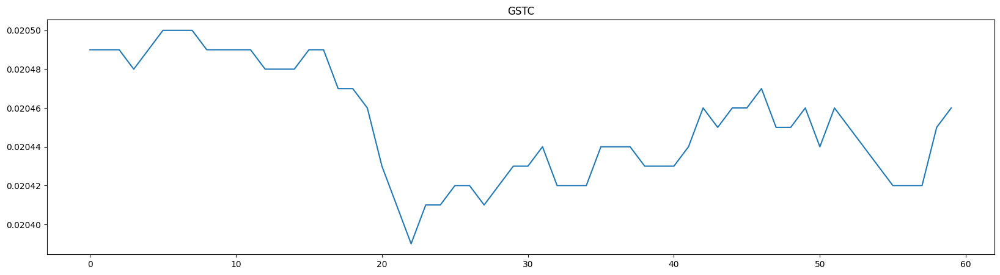

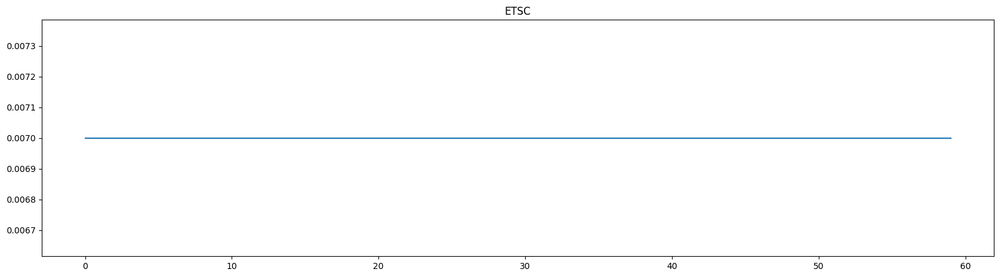

...

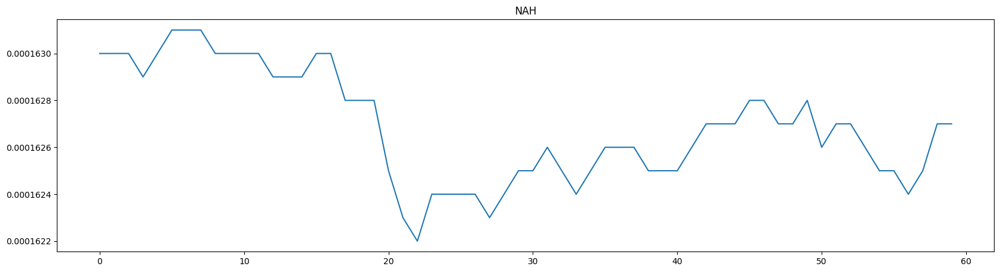

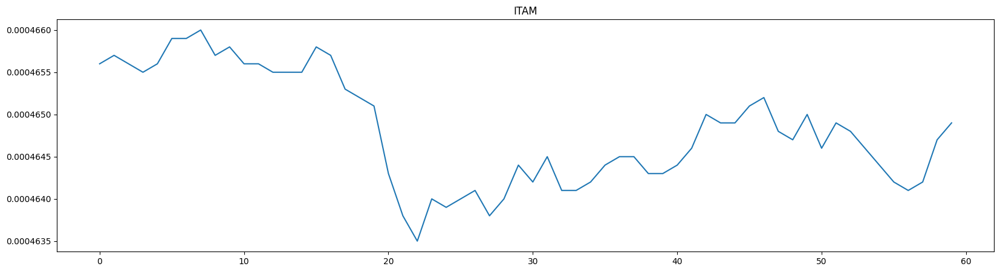

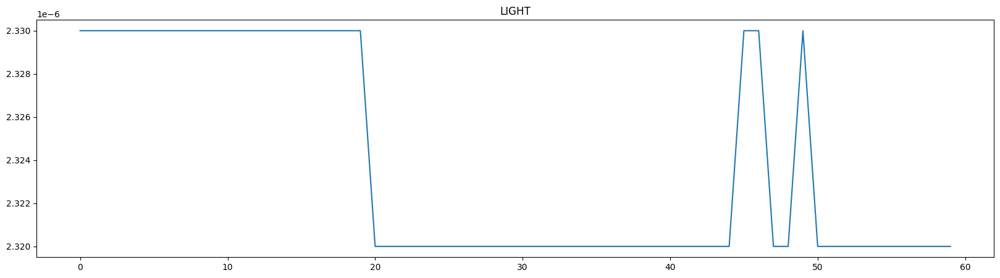

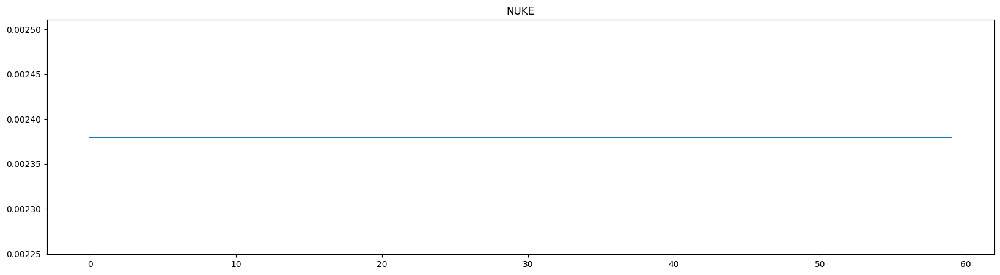

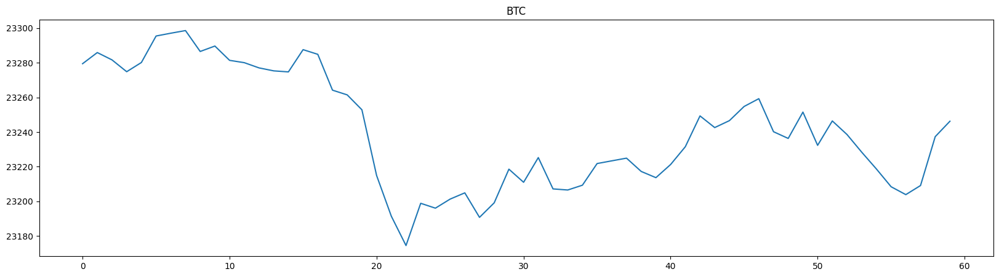

In [36]:
for col in data.columns:
    plt.figure(figsize=(20,5))
    plt.title(col)
    plt.plot(data[col]) 

## Scaling everything

In [37]:
scaler = StandardScaler()
tickers_scaled = scaler.fit_transform(data.iloc[:,:]) 

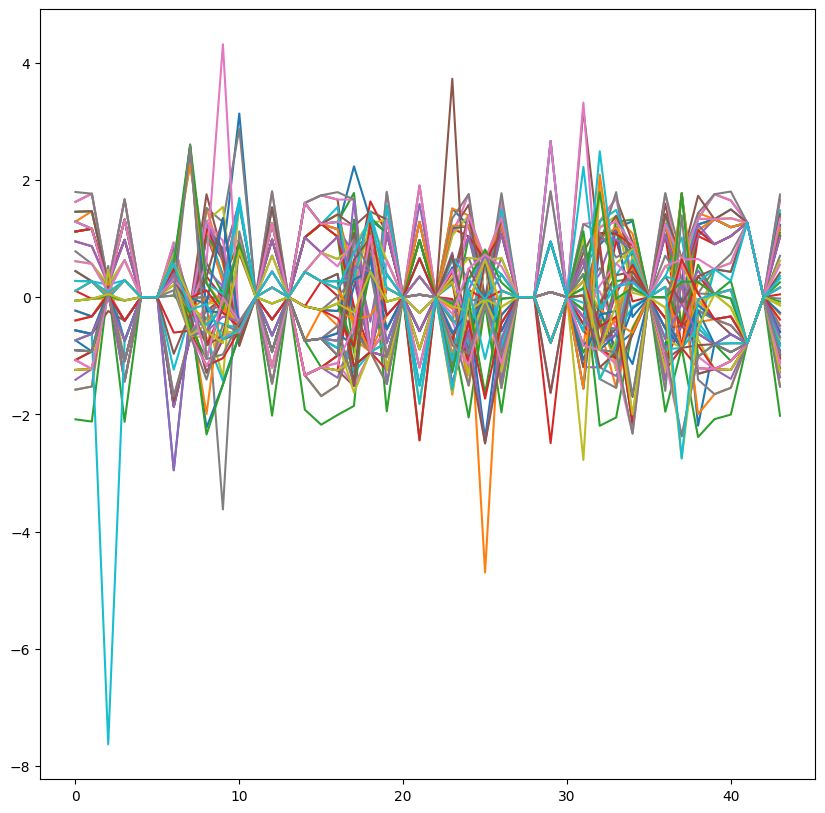

In [38]:
plt.figure(figsize=(10, 10))
plt.plot(tickers_scaled.T);

In [39]:
tickers_scaled[0]

array([ 1.11806575e+00,  1.16586849e+00,  2.11456981e-01,  1.32218850e+00,
       -8.67361738e-19,  4.33680869e-19, -1.86942221e+00, -5.97532836e-01,
        1.28535766e+00,  6.99790070e-01,  3.13048664e+00, -1.73472348e-18,
        1.25631176e+00,  0.00000000e+00,  1.01862924e+00,  1.24712146e+00,
        1.15668459e+00,  2.22977751e+00,  1.32320301e+00,  1.09122202e+00,
        0.00000000e+00,  9.72436919e-01, -1.08420217e-19,  1.51063640e+00,
        1.21248786e+00,  5.54737911e-01,  1.21807816e+00,  2.16840434e-19,
        0.00000000e+00,  2.66149170e+00, -5.42101086e-20, -2.17377774e-01,
       -3.02029035e-01,  1.18322748e+00,  1.29194885e+00, -2.71050543e-20,
        1.23934668e+00, -1.13039996e-01,  1.23781542e+00,  1.32858213e+00,
        1.19172709e+00,  1.26834366e+00,  4.33680869e-19,  1.16838025e+00])

In [40]:
tickers_scaled[1]

array([ 1.28661838e+00,  1.46480913e+00,  2.11456981e-01,  1.32218850e+00,
       -8.67361738e-19,  4.33680869e-19, -1.77911196e+00, -5.97532836e-01,
        1.51941368e+00,  5.70796509e-01, -8.14383903e-01, -1.73472348e-18,
        1.25631176e+00,  0.00000000e+00,  1.60629995e+00,  1.24712146e+00,
        1.40997318e+00,  4.14182592e-01, -9.32450853e-01,  1.32505531e+00,
        0.00000000e+00, -8.89676330e-01, -1.08420217e-19,  1.51063640e+00,
        1.39390749e+00, -2.07497386e-01,  1.35649613e+00,  2.16840434e-19,
        0.00000000e+00,  9.44400282e-01, -5.42101086e-20, -5.83060010e-01,
       -4.01599047e-01,  1.38548859e+00,  1.08428772e+00, -2.71050543e-20,
        1.41681876e+00, -4.89839983e-01,  1.43377564e+00,  1.32858213e+00,
        1.34386246e+00,  1.26834366e+00,  4.33680869e-19,  1.36378308e+00])

### 2 version of scaling

In [139]:
fm = data.mean(axis=1)
data = data.apply(lambda x: x - fm, axis=0)
W_abs = data.abs().sum(axis=1)
data = data.div(np.where(W_abs == 0, 1e-6, W_abs), axis='index')
data

,GREXIT,BITCM,INK,CMA,TLOS,FUND,KUMA,URAC,ACHC,XCG,...,ADT,DANK,BTO,RIF,CTR,FAIRC,INX,KLP,BTMK,BTC
timestep,,,,,,,,,,,,,,,,,,,,,
1.673827e+09,-0.015721,-0.015721,-0.015721,-0.015721,-0.015717,-0.015712,-0.015721,-0.015721,-0.015721,-0.015721,...,-0.015721,-0.015720,-0.015721,-0.015719,-0.015721,-0.015721,-0.015721,-0.015720,-0.015721,0.5
1.673914e+09,-0.015720,-0.015720,-0.015720,-0.015720,-0.015717,-0.015711,-0.015720,-0.015720,-0.015720,-0.015720,...,-0.015720,-0.015720,-0.015720,-0.015718,-0.015720,-0.015720,-0.015720,-0.015720,-0.015720,0.5
1.674000e+09,-0.015719,-0.015719,-0.015719,-0.015719,-0.015716,-0.015712,-0.015719,-0.015719,-0.015719,-0.015719,...,-0.015719,-0.015719,-0.015719,-0.015718,-0.015719,-0.015719,-0.015719,-0.015719,-0.015719,0.5
1.674086e+09,-0.015719,-0.015719,-0.015719,-0.015719,-0.015716,-0.015711,-0.015719,-0.015719,-0.015719,-0.015719,...,-0.015719,-0.015719,-0.015719,-0.015718,-0.015719,-0.015719,-0.015719,-0.015719,-0.015719,0.5
1.674173e+09,-0.015717,-0.015717,-0.015717,-0.015717,-0.015714,-0.015709,-0.015717,-0.015717,-0.015717,-0.015717,...,-0.015717,-0.015717,-0.015717,-0.015716,-0.015717,-0.015717,-0.015717,-0.015717,-0.015717,0.5
1.674259e+09,-0.015717,-0.015717,-0.015717,-0.015717,-0.015714,-0.015709,-0.015717,-0.015717,-0.015717,-0.015717,...,-0.015717,-0.015716,-0.015717,-0.015715,-0.015717,-0.015717,-0.015717,-0.015716,-0.015717,0.5
1.674346e+09,-0.015717,-0.015717,-0.015717,-0.015717,-0.015714,-0.015710,-0.015717,-0.015717,-0.015717,-0.015717,...,-0.015717,-0.015717,-0.015717,-0.015716,-0.015717,-0.015717,-0.015717,-0.015717,-0.015717,0.5
1.674432e+09,-0.015720,-0.015720,-0.015720,-0.015720,-0.015717,-0.015713,-0.015720,-0.015720,-0.015720,-0.015720,...,-0.015720,-0.015720,-0.015720,-0.015719,-0.015720,-0.015720,-0.015720,-0.015720,-0.015720,0.5
1.674518e+09,-0.015717,-0.015717,-0.015717,-0.015717,-0.015714,-0.015710,-0.015717,-0.015717,-0.015717,-0.015717,...,-0.015717,-0.015717,-0.015717,-0.015716,-0.015717,-0.015717,-0.015717,-0.015717,-0.015717,0.5


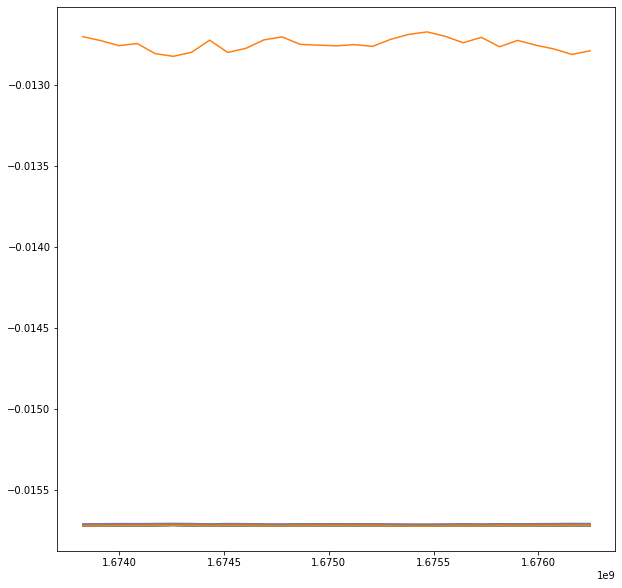

In [142]:
plt.figure(figsize=(10, 10))
plt.plot(data.iloc[:,:-1]);

## Basic KMeans

100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 39.79it/s]


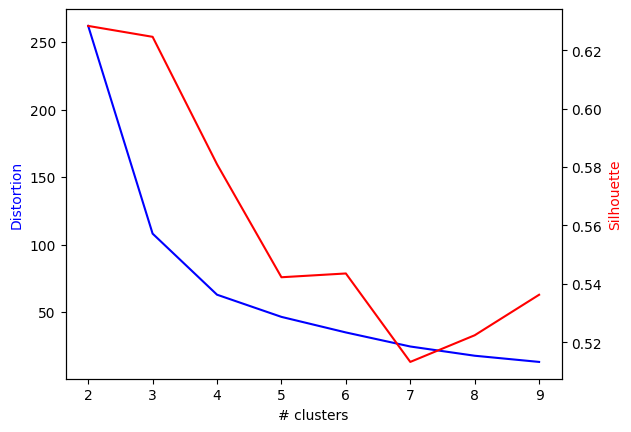

In [41]:
distortions = [] # Сумма кв расстояний от объектов до центра кластера, взвешенная по весам (при их наличии)
silhouette = []
K = range(2, 10)
for k in tqdm(K):
    kmeanModel = TimeSeriesKMeans(n_clusters=k, metric="euclidean", n_jobs=6, max_iter=10, n_init=5)
    kmeanModel.fit(data)
    distortions.append(kmeanModel.inertia_)
    silhouette.append(silhouette_score(data, kmeanModel.labels_, metric="euclidean"))
    # silhouette_score считает насколько чисты кластеры
    
fig, ax1 = plt.subplots()

ax2 = ax1.twinx()
ax1.plot(K, distortions, 'b-')
ax2.plot(K, silhouette, 'r-')

ax1.set_xlabel('# clusters')
ax1.set_ylabel('Distortion', color='b')
ax2.set_ylabel('Silhouette', color='r')

plt.show()

In [42]:
n_clusters = 4
ts_kmeans = TimeSeriesKMeans(n_clusters=n_clusters, metric="euclidean", n_jobs=6, max_iter=10)
ts_kmeans.fit(data)

TimeSeriesKMeans(max_iter=10, n_clusters=4, n_jobs=6)

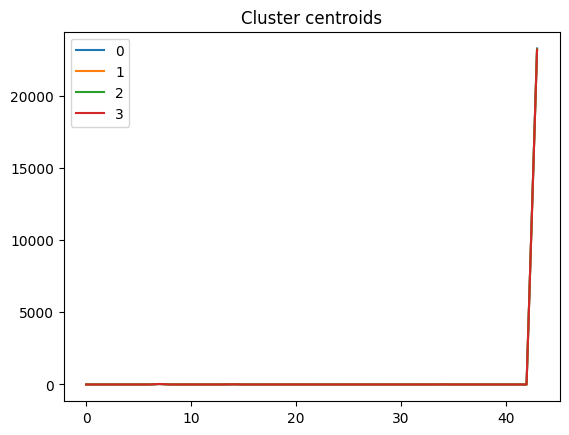

In [43]:
for cluster_number in range(n_clusters): # Построим усредненные ряды внутри каждого кластера
    plt.plot(ts_kmeans.cluster_centers_[cluster_number, :, 0].T, label=cluster_number)
plt.title("Cluster centroids") # Быки и медведи
plt.legend()
plt.show()

In [44]:
# посмотрим наличие корреляции между полученными кластерами и биржевыми секторами
data['cluster'] = ts_kmeans.predict(data)
# pd.DataFrame(data.groupby('cluster').value_counts())

/Users/alsukurmakaeva/miniconda3/envs/dqual_alpha_nlp/lib/python3.10/site-packages/tslearn/utils/utils.py:88: UserWarning: 2-Dimensional data passed. Assuming these are 60 1-dimensional timeseries
  warnings.warn('2-Dimensional data passed. Assuming these are '


In [45]:
def plot_cluster_tickers(current_cluster):
    fig, ax = plt.subplots(
        int(np.ceil(current_cluster.shape[0]/4)),
        4,
        figsize=(15, 3*int(np.ceil(current_cluster.shape[0]/4)))
    )
    fig.autofmt_xdate(rotation=45)
    ax = ax.reshape(-1)

    for index, (_, row) in enumerate(current_cluster.iterrows()):
        ax[index].plot(row.iloc[5:-1])
        ax[index].set_title(f"{row.shortName}\n{row.sector}")
        plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

                          Cluster number: 0


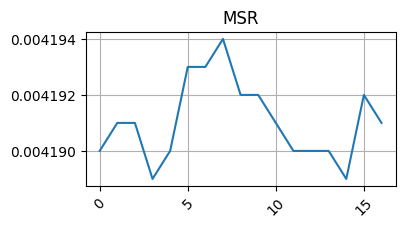

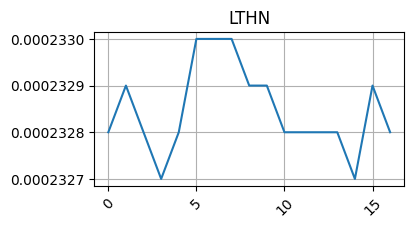

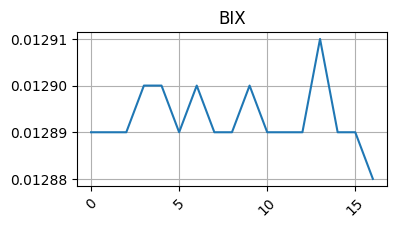

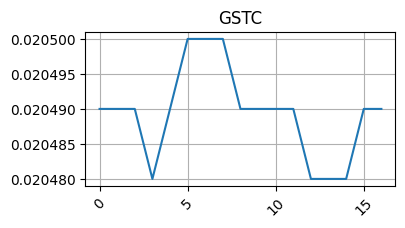

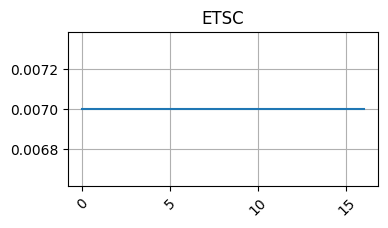

...

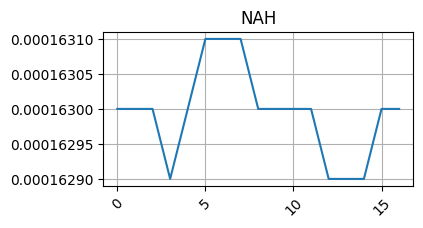

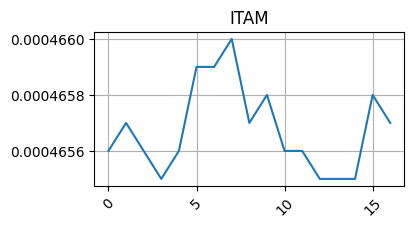

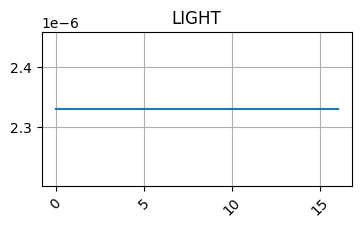

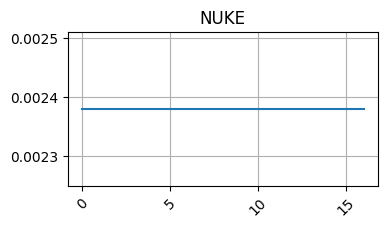

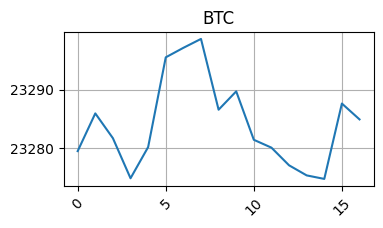

                          Cluster number: 1


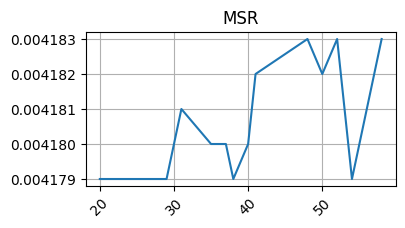

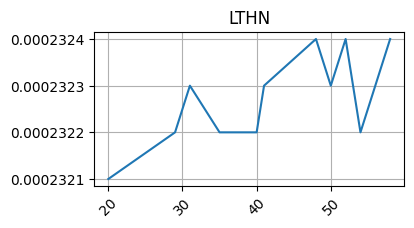

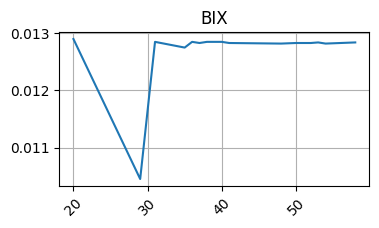

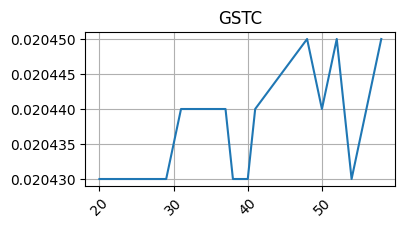

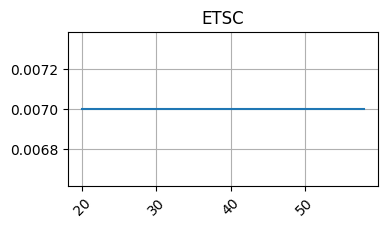

...

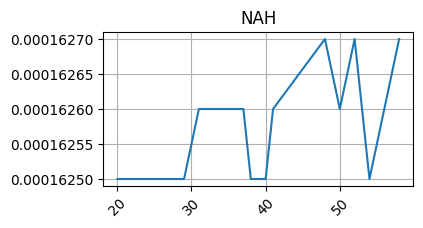

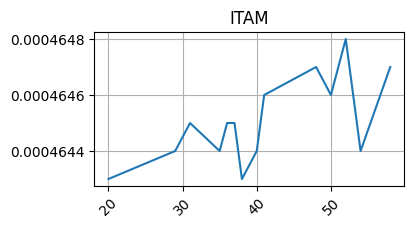

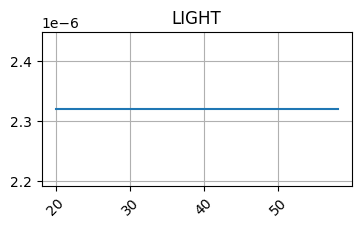

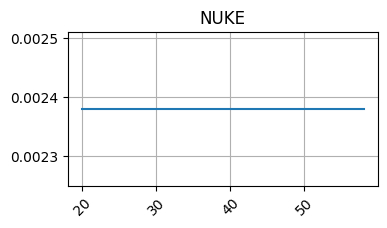

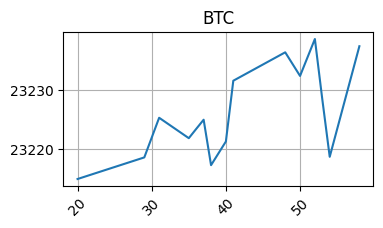

                          Cluster number: 2


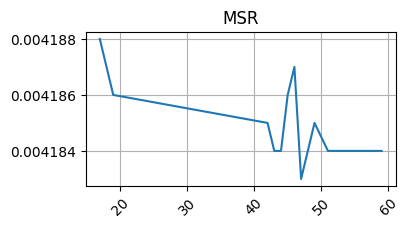

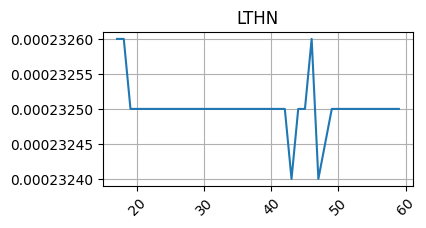

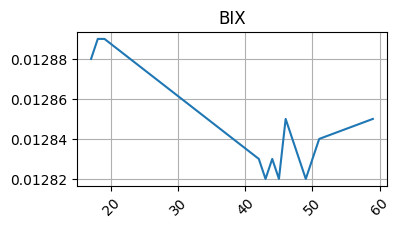

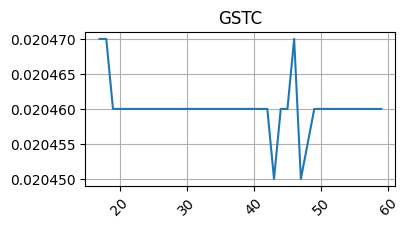

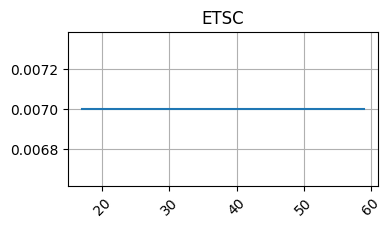

...

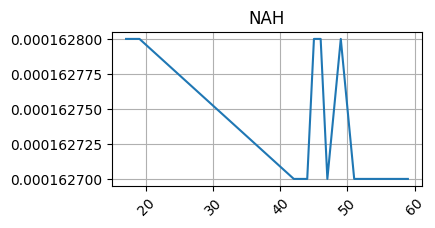

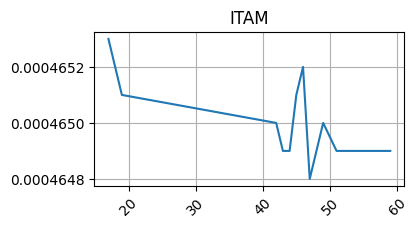

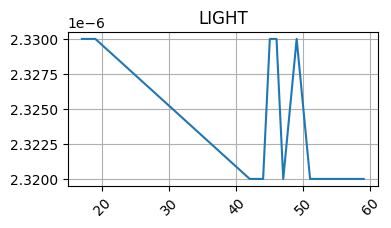

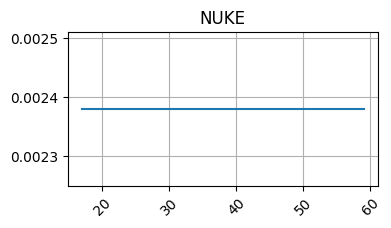

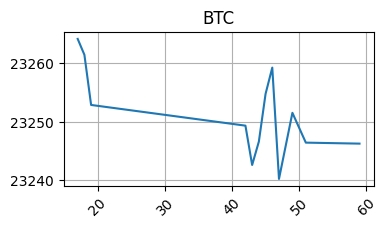

                          Cluster number: 3


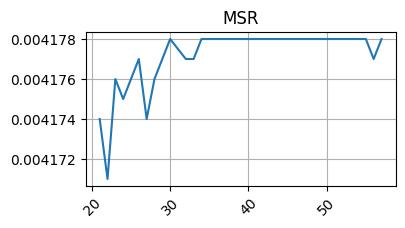

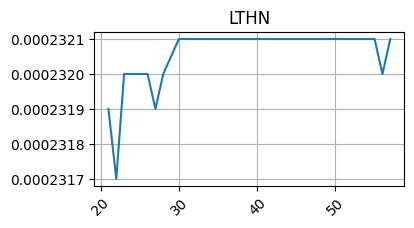

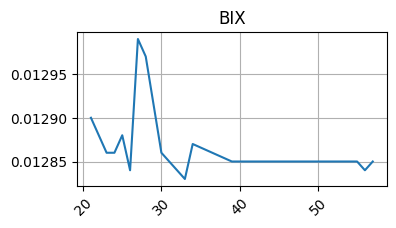

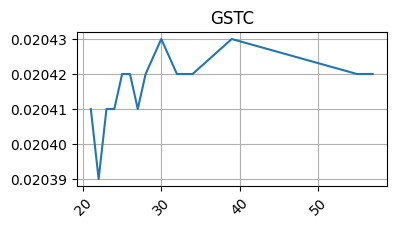

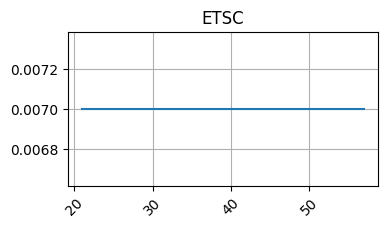

...

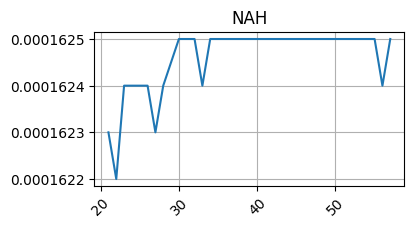

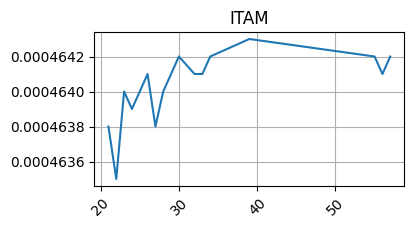

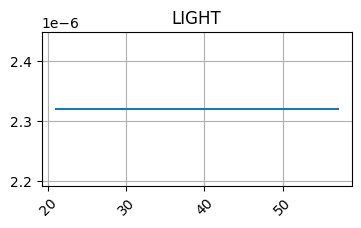

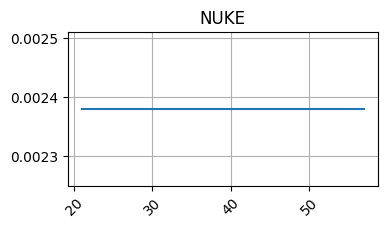

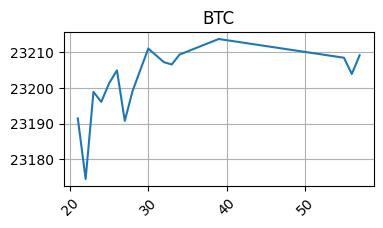

In [46]:
# TimeSeriesKMeans
for cluster in range(n_clusters):
    print("=================================================================================")
    print(f"                          Cluster number: {cluster}")
    print("=================================================================================")

    df_cluster = data[data.cluster==cluster]
    
    for i in range(len(data.columns)):
        if data.columns[i] != 'cluster':
            plt.figure(figsize=(4,2))
            plt.plot(df_cluster[data.columns[i]])
            plt.xticks(rotation=45)
            plt.title(data.columns[i])
            plt.grid(True)
            plt.show()

## DTW

100%|█████████████████████████████████████████████| 8/8 [00:07<00:00,  1.02it/s]


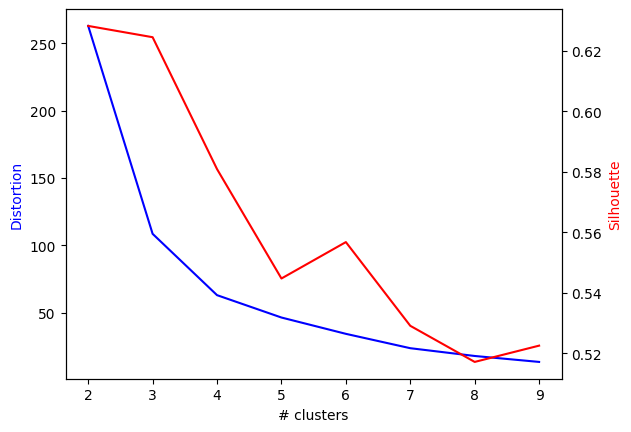

In [47]:
from tslearn.clustering import TimeSeriesKMeans, silhouette_score
distortions = []
silhouette = []
K = range(2, 10)
for k in tqdm(K):
    kmeanModel = TimeSeriesKMeans(n_clusters=k, metric="dtw", n_jobs=6, max_iter=10, n_init=5)
    kmeanModel.fit(data)
    distortions.append(kmeanModel.inertia_)
    silhouette.append(silhouette_score(data.iloc[:, :-1], kmeanModel.labels_, metric="dtw"))
    
    # silhouette_score считает насколько чисты класстеры
    # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html
    # Для metric="dtw" берем реализацию из tslearn:
    # https://tslearn.readthedocs.io/en/stable/gen_modules/clustering/tslearn.clustering.silhouette_score.html

    
fig, ax1 = plt.subplots()

ax2 = ax1.twinx()
ax1.plot(K, distortions, 'b-')
ax2.plot(K, silhouette, 'r-')

ax1.set_xlabel('# clusters')
ax1.set_ylabel('Distortion', color='b')
ax2.set_ylabel('Silhouette', color='r')

plt.show()

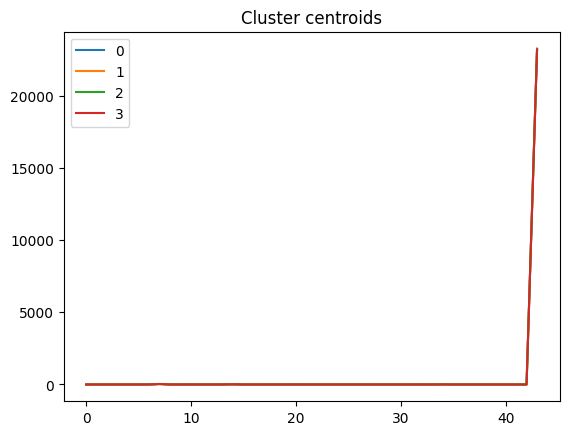

In [48]:
n_clusters = 4
ts_kmeans_dtw = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", n_jobs=6, max_iter=10,random_state=42)
ts_kmeans_dtw.fit(data.iloc[:, :-1])

for cluster_number in range(n_clusters):
    plt.plot(ts_kmeans_dtw.cluster_centers_[cluster_number, :, 0].T, label=cluster_number)
plt.title("Cluster centroids")
plt.legend()
plt.show()

In [49]:
data['cluster'] = ts_kmeans_dtw.predict(data.iloc[:, :-1])

/Users/alsukurmakaeva/miniconda3/envs/dqual_alpha_nlp/lib/python3.10/site-packages/tslearn/utils/utils.py:88: UserWarning: 2-Dimensional data passed. Assuming these are 60 1-dimensional timeseries
  warnings.warn('2-Dimensional data passed. Assuming these are '


                          Cluster number: 0


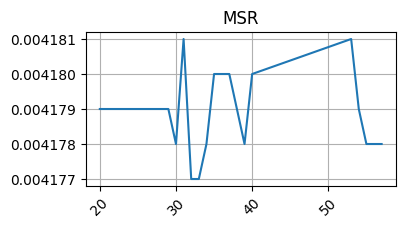

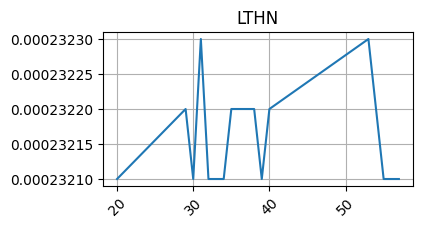

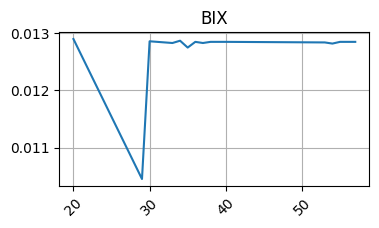

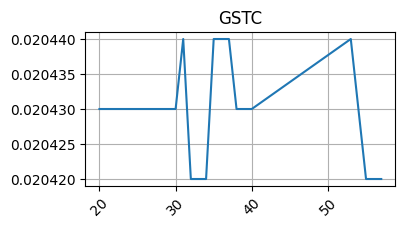

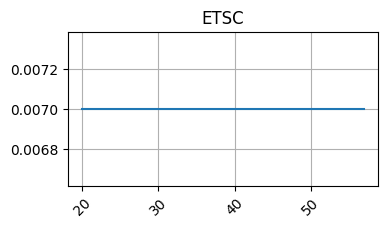

...

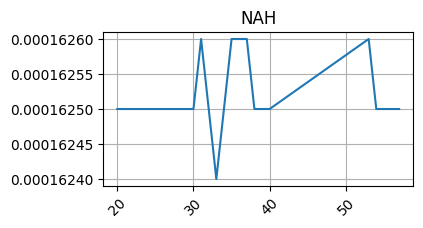

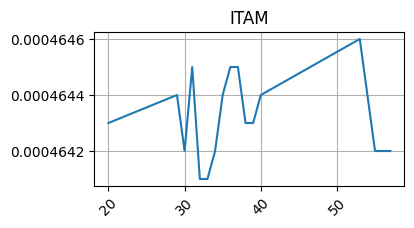

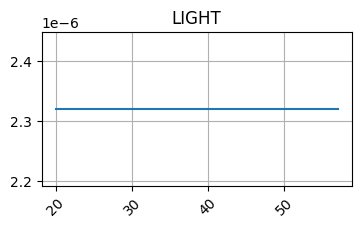

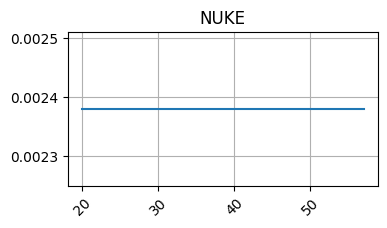

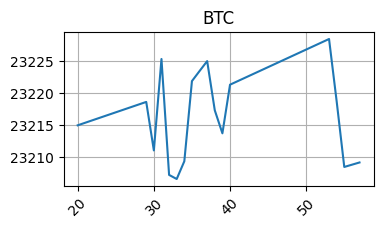

                          Cluster number: 1


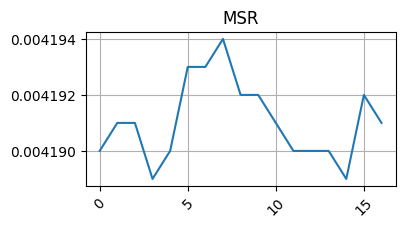

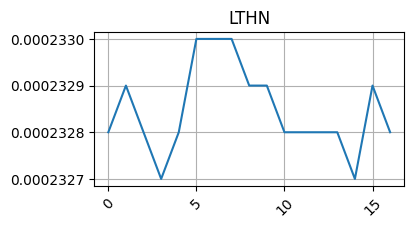

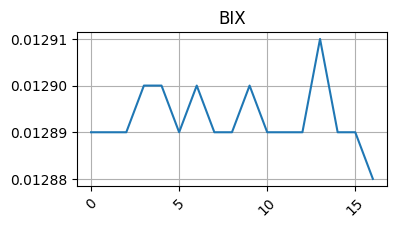

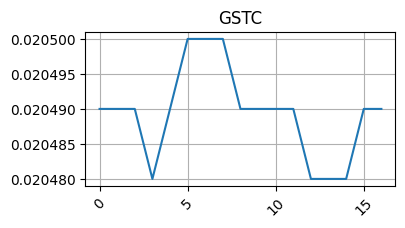

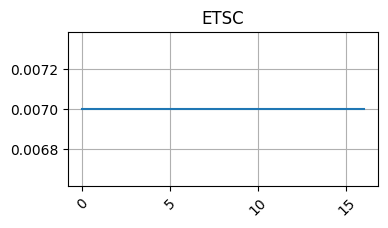

...

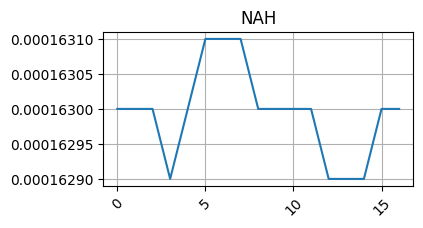

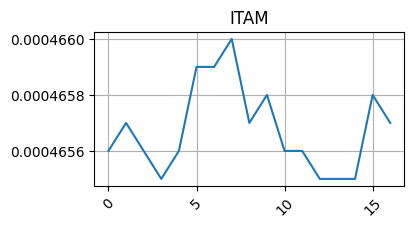

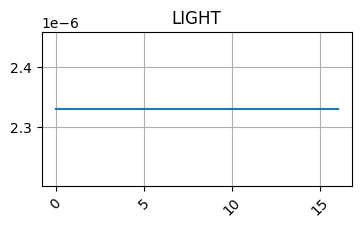

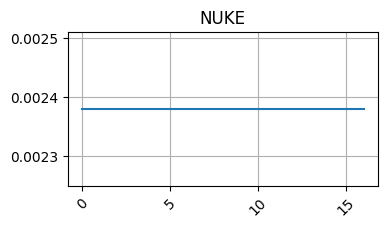

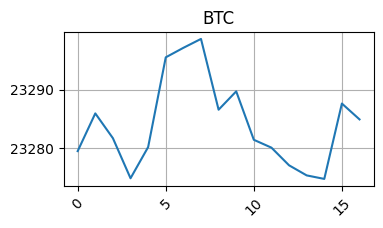

                          Cluster number: 2


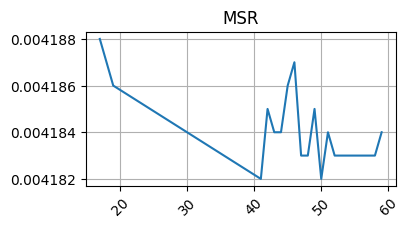

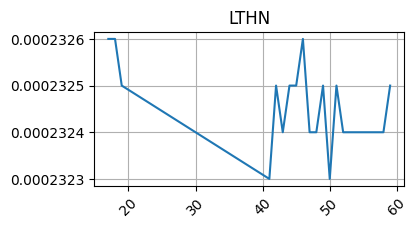

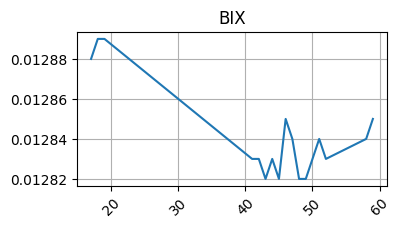

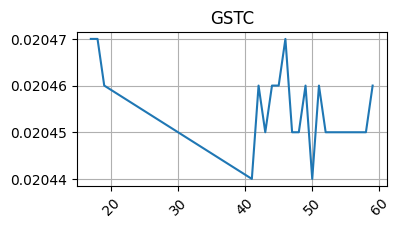

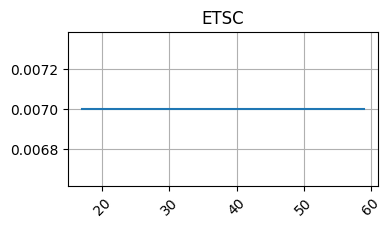

...

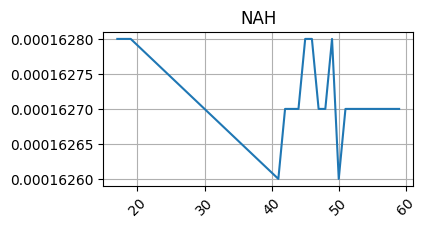

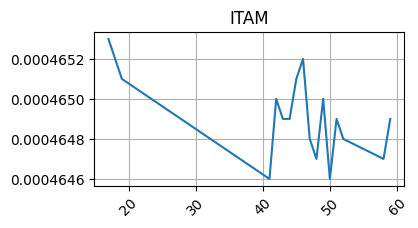

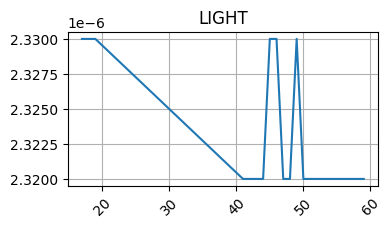

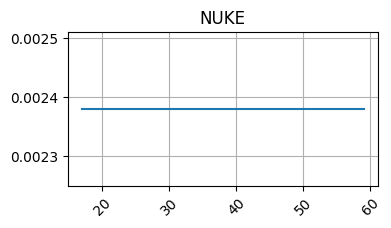

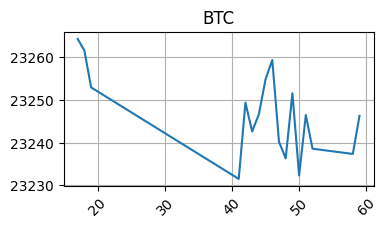

                          Cluster number: 3


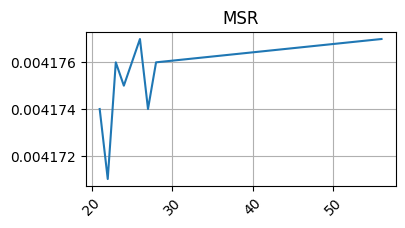

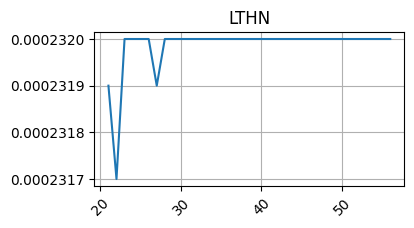

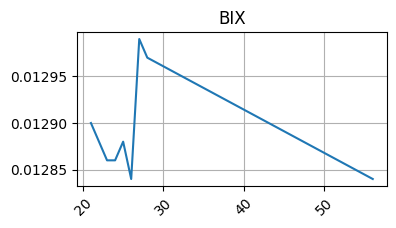

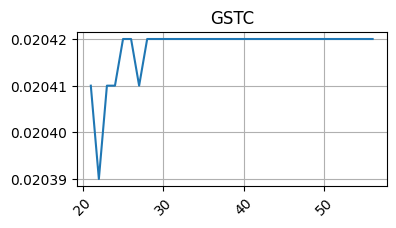

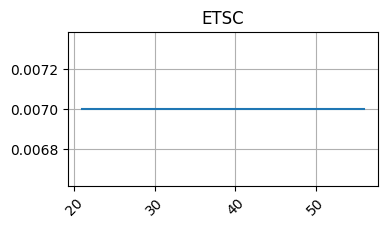

...

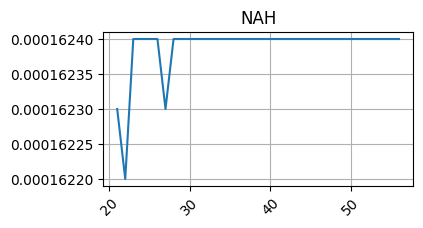

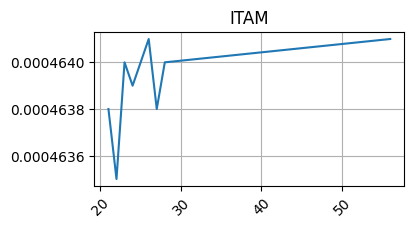

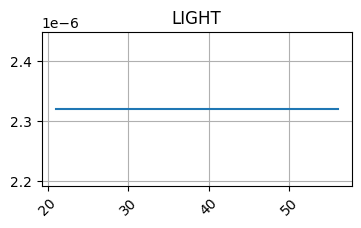

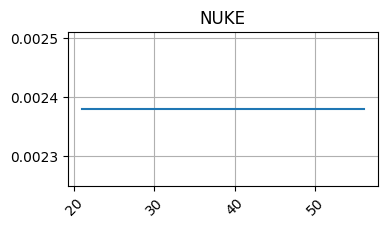

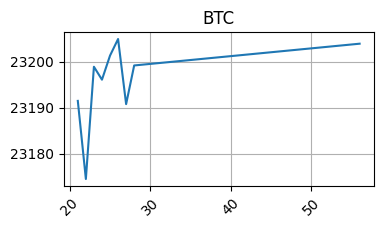

In [50]:
for cluster in range(n_clusters):
    print("=================================================================================")
    print(f"                          Cluster number: {cluster}")
    print("=================================================================================")

    df_cluster = data[data.cluster==cluster]
    
    for i in range(len(data.columns)):
        if data.columns[i] != 'cluster':
            plt.figure(figsize=(4,2))
            plt.plot(df_cluster[data.columns[i]])
            plt.xticks(rotation=45)
            plt.title(data.columns[i])
            plt.grid(True)
            plt.show()